In [46]:
import pandas as pd 
import numpy as np 
import configparser
import os
import seaborn as sns
import plotly_express as px
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, TfidfTransformer
from sklearn.preprocessing import normalize
import nltk 

config = configparser.ConfigParser()
config.read("../env.ini")
data_home = config['DEFAULT']['data_home']
output_dir = config['DEFAULT']['output_dir']
base_path = config['DEFAULT']['base_path']
code_dir = config['DEFAULT']['code_dir']

data_prefix = 'Maha'
out_path = f'{output_dir}/{data_prefix}'
OHCO = ['book_id','chap_id','sec_id', 'para_num', 'sent_num', 'token_num']


os.chdir(code_dir)
import preprocess
import bow_analysis
os.chdir(base_path + r"\notebooks")

#### Reading the Files

In [2]:
CORPUS = pd.read_csv(fr"{output_dir}\F2\{data_prefix}-CORPUS.csv", sep="|").set_index(OHCO)
LIB = pd.read_csv(fr"{output_dir}\F2\{data_prefix}-LIB.csv", sep="|").set_index(OHCO[:1])
LIB2 = pd.read_csv(fr"{output_dir}\F2\{data_prefix}-LIB2.csv", sep="|").set_index(OHCO[:2])
VOCAB = pd.read_csv(fr"{output_dir}\F2\{data_prefix}-VOCAB.csv", sep="|")
LIB2

chap_name              book_name  \
book_id chap_id                                                 
1       1           Anukramanika Parva              Adi Parva   
        2               Sangraha Parva              Adi Parva   
        3                Paushya Parva              Adi Parva   
        4                Pauloma Parva              Adi Parva   
        5                 Astika Parva              Adi Parva   
...                                ...                    ...   
15      2           Putradarsana Parva     Asramavasika Parva   
        3           Naradagamana Parva     Asramavasika Parva   
16      1                Mausala Parva          Mausala Parva   
17      1        Mahaprasthanika Parva  Mahaprasthanika Parva   
18      1         Svargarohanika Parva   Svargarohanika Parva   

                source_file_path  chap_len  n_secs  n_sents  n_tokens  
book_id chap_id                                                        
1       1             maha01.txt      7511       1      374      7511  
        2             maha01.txt      8655       1      524      8655  
        3             maha01.txt      6137       1      396      6137  
        4             maha01.txt      4661       9      261      4661  
        5             maha01.txt     30619      46     1753     30619  
...                          ...       ...     ...      ...       ...  
15      2             maha15.txt      6789       8      417      6789  
        3             maha15.txt      2551       3      149      2551  
16      1             maha16.txt      8072       7      432      8072  
17      1             maha17.txt      3062       2      206      3062  
18      1             maha18.txt      8628       5      495      8628  

[99 rows x 7 columns]

In [3]:
LIB.sum(axis=0)

source_file_path    maha01.txtmaha02.txtmaha03.txtmaha04.txtmaha05...
raw_title           Adi ParvaSabha ParvaVana ParvaVirata ParvaUdyo...
book_len                                                      2409433
n_chaps                                                            99
n_secs                                                           2089
n_sents                                                        126870
n_tokens                                                      2409433
n_chars                                                      11166915
parva_name          AdiSabhaVanaVirataUdyogaBhishmaDronaKarnaShaly...
timeline            Pre-WarPre-WarPre-WarPre-WarPre-WarWarWarWarWa...
key_focus           Origins, family lineages, childhood of heroesD...
main_theme          lineagepowerphilosophystrategydiplomacydharmas...
broad_theme         MythologyStrategyPhilosophyStrategyPhilosophyP...
dtype: object

In [4]:
LIB2.sum(axis=0)

chap_name           Anukramanika ParvaSangraha ParvaPaushya ParvaP...
book_name           Adi ParvaAdi ParvaAdi ParvaAdi ParvaAdi ParvaA...
source_file_path    maha01.txtmaha01.txtmaha01.txtmaha01.txtmaha01...
chap_len                                                      2409433
n_secs                                                           2089
n_sents                                                        126870
n_tokens                                                      2409433
dtype: object

In [5]:
CORPUS

pos_tuple  \
book_id chap_id sec_id para_num sent_num token_num                            
1       1       1      0        0        1          ('Anukramanika', 'NNP')   
                                         2                 ('Parva', 'NNP')   
                                         4                    ('Om', 'NNP')   
                                1        0                ('Having', 'VBG')   
                                         1                 ('bowed', 'VBN')   
...                                                                     ...   
18      1       5      0        147      25                    ('of', 'IN')   
                                         26               ('Vishnu', 'NNP')   
                                         27                  ('like', 'IN')   
                                         28               ('Vishnu', 'NNP')   
                                         29              ('himself', 'PRP')   

                                                    pos     token_str  \
book_id chap_id sec_id para_num sent_num token_num                      
1       1       1      0        0        1          NNP  Anukramanika   
                                         2          NNP         Parva   
                                         4          NNP            Om   
                                1        0          VBG        Having   
                                         1          VBN         bowed   
...                                                 ...           ...   
18      1       5      0        147      25          IN            of   
                                         26         NNP        Vishnu   
                                         27          IN          like   
                                         28         NNP        Vishnu   
                                         29         PRP       himself   

                                                        term_str pos_group  
book_id chap_id sec_id para_num sent_num token_num                          
1       1       1      0        0        1          anukramanika        NN  
                                         2                 parva        NN  
                                         4                    om        NN  
                                1        0                having        VB  
                                         1                 bowed        VB  
...                                                          ...       ...  
18      1       5      0        147      25                   of        IN  
                                         26               vishnu        NN  
                                         27                 like        IN  
                                         28               vishnu        NN  
                                         29              himself        PR  

[2409433 rows x 5 columns]

#### Creating BOW - Chapter Level

In [6]:
chap_bow = bow_analysis.bow_rep(CORPUS, "CHAPS")

chap_bow

n
book_id chap_id term_str        
1       1       a             57
                abhimanyu      2
                abikshit       1
                able           4
                abode          5
...                           ..
18      1       your           5
                yours          1
                yourself       1
                yudhamanyu     1
                yudhishthira  30

[245040 rows x 1 columns]

In [7]:
DTCM = chap_bow.n.unstack(fill_value=0)
DTCM.to_csv(fr"{output_dir}\CHAP_BOW\{data_prefix}-DTCM-CHAPS.csv",sep = "|")
DTCM

term_str         01  1  10  100  1000  10000  100000  1001  1002  1003  ...  \
book_id chap_id                                                         ...   
1       1         0  0   0    0     0      0       0     0     0     0  ...   
        2         0  0   0    0     0      0       0     0     0     0  ...   
        3         0  0   0    0     0      0       0     0     0     0  ...   
        4         0  0   0    0     0      0       0     0     0     0  ...   
        5         0  1   0    0     0      0       0     0     0     0  ...   
...              .. ..  ..  ...   ...    ...     ...   ...   ...   ...  ...   
15      2         0  0   0    0     0      0       0     0     0     0  ...   
        3         0  0   0    0     0      0       0     0     0     0  ...   
16      1         0  0   0    0     1      0       0     0     0     0  ...   
17      1         0  0   0    0     2      0       0     0     0     0  ...   
18      1         0  0   0    0     1      0       0     0     0     0  ...   

term_str         yuyudhana  yuyudhanas  yuyutshu  yuyutsu  yuyutsus  zeal  \
book_id chap_id                                                             
1       1                1           0         0        0         0     0   
        2                0           0         0        0         0     0   
        3                0           0         0        0         0     0   
        4                0           0         0        0         0     0   
        5                0           0         0        0         0     0   
...                    ...         ...       ...      ...       ...   ...   
15      2                0           0         0        0         0     0   
        3                0           0         0        1         0     0   
16      1                6           0         0        0         0     0   
17      1                0           0         0        2         0     0   
18      1                0           0         0        0         0     0   

term_str         zealously  zenana  zodiac  zone  
book_id chap_id                                   
1       1                0       0       0     0  
        2                0       0       0     0  
        3                0       0       1     0  
        4                0       0       0     0  
        5                0       0       0     0  
...                    ...     ...     ...   ...  
15      2                0       0       0     0  
        3                0       0       0     0  
16      1                0       0       0     0  
17      1                0       0       0     0  
18      1                0       0       0     0  

[99 rows x 30681 columns]

In [8]:
DF = DTCM.astype('bool').sum() 
DF.sort_values(ascending=False)

term_str
all            99
with           99
their          99
not            99
of             99
               ..
intricacy       1
intrepid        1
intrare         1
intoxicates     1
zone            1
Length: 30681, dtype: int64

#### Computing TFIDF with Sum based Term Frequency and standard IDF

In [9]:
TFIDF_dict = bow_analysis.compute_TFIDF(chap_bow, "sum", "standard")
TFIDF_dict['TF']

term_str          01         1   10  100      1000  10000  100000  1001  1002  \
book_id chap_id                                                                 
1       1        0.0  0.000000  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
        2        0.0  0.000000  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
        3        0.0  0.000000  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
        4        0.0  0.000000  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
        5        0.0  0.000033  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
...              ...       ...  ...  ...       ...    ...     ...   ...   ...   
15      2        0.0  0.000000  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
        3        0.0  0.000000  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
16      1        0.0  0.000000  0.0  0.0  0.000124    0.0     0.0   0.0   0.0   
17      1        0.0  0.000000  0.0  0.0  0.000653    0.0     0.0   0.0   0.0   
18      1        0.0  0.000000  0.0  0.0  0.000116    0.0     0.0   0.0   0.0   

term_str         1003  ...  yuyudhana  yuyudhanas  yuyutshu   yuyutsu  \
book_id chap_id        ...                                              
1       1         0.0  ...   0.000133         0.0       0.0  0.000000   
        2         0.0  ...   0.000000         0.0       0.0  0.000000   
        3         0.0  ...   0.000000         0.0       0.0  0.000000   
        4         0.0  ...   0.000000         0.0       0.0  0.000000   
        5         0.0  ...   0.000000         0.0       0.0  0.000000   
...               ...  ...        ...         ...       ...       ...   
15      2         0.0  ...   0.000000         0.0       0.0  0.000000   
        3         0.0  ...   0.000000         0.0       0.0  0.000392   
16      1         0.0  ...   0.000743         0.0       0.0  0.000000   
17      1         0.0  ...   0.000000         0.0       0.0  0.000653   
18      1         0.0  ...   0.000000         0.0       0.0  0.000000   

term_str         yuyutsus  zeal  zealously  zenana    zodiac  zone  
book_id chap_id                                                     
1       1             0.0   0.0        0.0     0.0  0.000000   0.0  
        2             0.0   0.0        0.0     0.0  0.000000   0.0  
        3             0.0   0.0        0.0     0.0  0.000163   0.0  
        4             0.0   0.0        0.0     0.0  0.000000   0.0  
        5             0.0   0.0        0.0     0.0  0.000000   0.0  
...                   ...   ...        ...     ...       ...   ...  
15      2             0.0   0.0        0.0     0.0  0.000000   0.0  
        3             0.0   0.0        0.0     0.0  0.000000   0.0  
16      1             0.0   0.0        0.0     0.0  0.000000   0.0  
17      1             0.0   0.0        0.0     0.0  0.000000   0.0  
18      1             0.0   0.0        0.0     0.0  0.000000   0.0  

[99 rows x 30681 columns]

In [10]:
TFIDF_dict['IDF']

term_str
01           6.629357
1            3.044394
10           3.459432
100          3.822002
1000         3.044394
               ...   
zeal         5.629357
zealously    4.629357
zenana       6.629357
zodiac       5.629357
zone         6.629357
Length: 30681, dtype: float64

In [11]:
TF = TFIDF_dict['TF'].stack().rename("TF")
IDF = TFIDF_dict['IDF']
TFIDF = TFIDF_dict['TFIDF'].stack().rename("TFIDF")

combined = pd.concat([TF, TFIDF], axis=1).reset_index()
combined['IDF'] = combined['term_str'].map(IDF)
combined.sort_values(by="TFIDF", ascending = False)

,book_id,chap_id,term_str,TF,TFIDF,IDF
89726,1,3,utanka,0.011080,0.044813,4.044394
1250568,3,12,satyabhama,0.006452,0.026093,4.044394
1610870,4,3,kichaka,0.007797,0.025789,3.307429
1061223,3,6,nala,0.008777,0.025706,2.928917
114732,1,4,ruru,0.007509,0.024836,3.307429
...,...,...,...,...,...,...
1038952,3,5,taunts,0.000000,0.000000,5.629357
1038953,3,5,tautology,0.000000,0.000000,6.629357
1038954,3,5,tawas,0.000000,0.000000,6.629357
1038955,3,5,tawny,0.000000,0.000000,2.044394


In [12]:
chap_bow['tf'] = TFIDF_dict['TF'].stack()
chap_bow['tfidf'] = TFIDF_dict['TFIDF'].stack()
agg_tfidf = chap_bow.reset_index().groupby("term_str")\
            .agg({"tfidf":"mean","n":"mean"})

# Merging the Vocab Table to get the Frequently Used POS
agg_tfidf = agg_tfidf.reset_index().merge(VOCAB.reset_index()[['term_str','max_pos','cat_pos']], on="term_str", how='left')

print("Top 20 words in the corpus by TFIDF mean using the `max` count method and `book` as the bag:")
agg_tfidf.sort_values('tfidf', ascending=False).head(20).reset_index(drop=True)

Top 20 words in the corpus by TFIDF mean using the `max` count method and `book` as the bag:


,term_str,tfidf,n,max_pos,cat_pos
0,vimokshana,0.017821,1.000000,NNP,{'NNP'}
1,jayadhratha,0.017821,1.000000,NNP,{'NNP'}
2,upamanyu,0.011673,22.000000,NNP,{'NNP'}
3,kirata,0.010516,10.000000,NNP,{'NNP'}
4,athlete,0.010342,2.000000,JJ,"{'NN', 'JJ'}"
5,sthulakesa,0.009956,7.000000,NNP,{'NNP'}
6,jatugriha,0.009769,11.000000,NNP,{'NNP'}
7,mountainfestival,0.009390,2.000000,NN,{'NN'}
8,vakavadha,0.009265,8.000000,NNP,{'NNP'}
9,rituparna,0.009187,36.000000,NNP,{'NNP'}


In [13]:
", ".join(list(agg_tfidf.sort_values('tfidf', ascending=False)['term_str'].head(20)))

'vimokshana, jayadhratha, upamanyu, kirata, athlete, sthulakesa, jatugriha, mountainfestival, vakavadha, rituparna, paushya, arjunavanavasa, utanka, pramadvara, ratio, dasarnakas, exit, assiduously, parana, accusation'

In [14]:
chap_bow.to_csv(fr"{output_dir}\CHAP_BOW\{data_prefix}-BOW-CHAPS.csv",sep = "|")
chap_bow

n        tf     tfidf
book_id chap_id term_str                            
1       1       a             57  0.007589  0.000000
                abhimanyu      2  0.000266  0.000368
                abikshit       1  0.000133  0.000883
                able           4  0.000533  0.000135
                abode          5  0.000666  0.000135
...                           ..       ...       ...
18      1       your           5  0.000580  0.000210
                yours          1  0.000116  0.000189
                yourself       1  0.000116  0.000443
                yudhamanyu     1  0.000116  0.000267
                yudhishthira  30  0.003477  0.000260

[245040 rows x 3 columns]

In [15]:
TFIDF_dict['TFIDF'].to_csv(fr"{output_dir}\CHAP_BOW\{data_prefix}-TFIDF-CHAPS.csv",sep = "|")
TFIDF_dict['TFIDF']

term_str          01         1   10  100      1000  10000  100000  1001  1002  \
book_id chap_id                                                                 
1       1        0.0  0.000000  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
        2        0.0  0.000000  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
        3        0.0  0.000000  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
        4        0.0  0.000000  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
        5        0.0  0.000099  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
...              ...       ...  ...  ...       ...    ...     ...   ...   ...   
15      2        0.0  0.000000  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
        3        0.0  0.000000  0.0  0.0  0.000000    0.0     0.0   0.0   0.0   
16      1        0.0  0.000000  0.0  0.0  0.000377    0.0     0.0   0.0   0.0   
17      1        0.0  0.000000  0.0  0.0  0.001989    0.0     0.0   0.0   0.0   
18      1        0.0  0.000000  0.0  0.0  0.000353    0.0     0.0   0.0   0.0   

term_str         1003  ...  yuyudhana  yuyudhanas  yuyutshu   yuyutsu  \
book_id chap_id        ...                                              
1       1         0.0  ...   0.000223         0.0       0.0  0.000000   
        2         0.0  ...   0.000000         0.0       0.0  0.000000   
        3         0.0  ...   0.000000         0.0       0.0  0.000000   
        4         0.0  ...   0.000000         0.0       0.0  0.000000   
        5         0.0  ...   0.000000         0.0       0.0  0.000000   
...               ...  ...        ...         ...       ...       ...   
15      2         0.0  ...   0.000000         0.0       0.0  0.000000   
        3         0.0  ...   0.000000         0.0       0.0  0.000851   
16      1         0.0  ...   0.001245         0.0       0.0  0.000000   
17      1         0.0  ...   0.000000         0.0       0.0  0.001417   
18      1         0.0  ...   0.000000         0.0       0.0  0.000000   

term_str         yuyutsus  zeal  zealously  zenana    zodiac  zone  
book_id chap_id                                                     
1       1             0.0   0.0        0.0     0.0  0.000000   0.0  
        2             0.0   0.0        0.0     0.0  0.000000   0.0  
        3             0.0   0.0        0.0     0.0  0.000917   0.0  
        4             0.0   0.0        0.0     0.0  0.000000   0.0  
        5             0.0   0.0        0.0     0.0  0.000000   0.0  
...                   ...   ...        ...     ...       ...   ...  
15      2             0.0   0.0        0.0     0.0  0.000000   0.0  
        3             0.0   0.0        0.0     0.0  0.000000   0.0  
16      1             0.0   0.0        0.0     0.0  0.000000   0.0  
17      1             0.0   0.0        0.0     0.0  0.000000   0.0  
18      1             0.0   0.0        0.0     0.0  0.000000   0.0  

[99 rows x 30681 columns]

#### Analysis

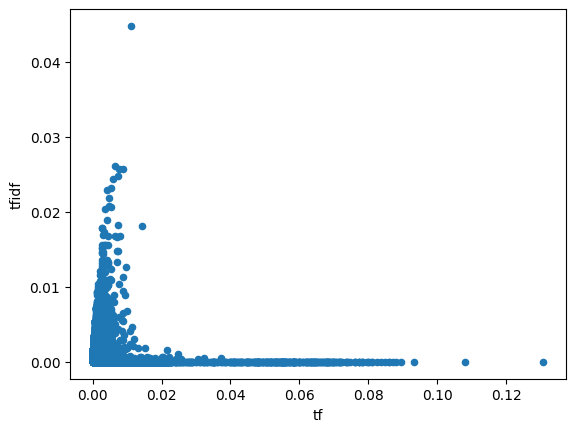

In [16]:
chap_bow.plot.scatter('tf', 'tfidf');

In [17]:
def top_CHAPS_for_term(term_str):
    X = chap_bow.reset_index().merge(LIB2, on=OHCO[:2])
    X = X.merge(LIB, on="book_id")
    # print(X.columns)
    
    X = X.query(f"term_str == '{term_str}'")\
        .groupby(['book_id','broad_theme','book_name'])\
        .agg({'tfidf':'mean', 'n':'sum', 'tf':'sum'})\
        .sort_values("book_id")
    

    return px.scatter(X.reset_index(), 'n','tfidf', 
                      color="broad_theme",
                      size='tf',
                      hover_name='book_name', 
                      height=600, 
                      width=600, 
                      title=f"{term_str}")

chap_bow.reset_index().merge(LIB2, on=OHCO[:2])

,book_id,chap_id,term_str,n,tf,tfidf,chap_name,book_name,source_file_path,chap_len,n_secs,n_sents,n_tokens
0,1,1,a,57,0.007589,0.000000,Anukramanika Parva,Adi Parva,maha01.txt,7511,1,374,7511
1,1,1,abhimanyu,2,0.000266,0.000368,Anukramanika Parva,Adi Parva,maha01.txt,7511,1,374,7511
2,1,1,abikshit,1,0.000133,0.000883,Anukramanika Parva,Adi Parva,maha01.txt,7511,1,374,7511
3,1,1,able,4,0.000533,0.000135,Anukramanika Parva,Adi Parva,maha01.txt,7511,1,374,7511
4,1,1,abode,5,0.000666,0.000135,Anukramanika Parva,Adi Parva,maha01.txt,7511,1,374,7511
...,...,...,...,...,...,...,...,...,...,...,...,...,...
245035,18,1,your,5,0.000580,0.000210,Svargarohanika Parva,Svargarohanika Parva,maha18.txt,8628,5,495,8628
245036,18,1,yours,1,0.000116,0.000189,Svargarohanika Parva,Svargarohanika Parva,maha18.txt,8628,5,495,8628
245037,18,1,yourself,1,0.000116,0.000443,Svargarohanika Parva,Svargarohanika Parva,maha18.txt,8628,5,495,8628
245038,18,1,yudhamanyu,1,0.000116,0.000267,Svargarohanika Parva,Svargarohanika Parva,maha18.txt,8628,5,495,8628


In [18]:
top_CHAPS_for_term('vishnu')

In [19]:
DOC = pd.DataFrame(index=DTCM.index)
DOC['book_chap_sig'] = TFIDF_dict['TFIDF'].T.mean()
DOC['n_tokens'] = DTCM.sum(1)
DOC

book_chap_sig  n_tokens
book_id chap_id                         
1       1             0.000025      7511
        2             0.000025      8655
        3             0.000023      6137
        4             0.000023      4661
        5             0.000020     30619
...                        ...       ...
15      2             0.000014      6789
        3             0.000015      2551
16      1             0.000019      8072
17      1             0.000013      3062
18      1             0.000018      8628

[99 rows x 2 columns]

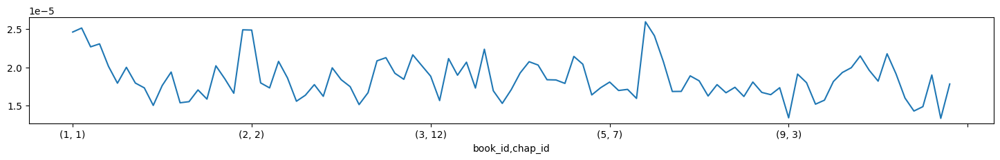

In [20]:
DOC.book_chap_sig.plot.line(figsize=(18,2));

In [21]:
import plotly.graph_objects as go

def plot_sig_docs2(book_id, type='scatter', use_bool=False):

    global DOC
    
    sig_col = "book_chap_sig" + "_bool" * use_bool
    print(sig_col)
    
    D = DOC.loc[book_id]
    title = LIB2.loc[book_id].book_name.iloc[0]
    point_size = (D.n_tokens / D.n_tokens.sum()) * 700
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=D.index, y=D[sig_col], 
                             text=D.index, 
                             mode = 'lines+markers+text',
                             marker = dict(size=point_size, color='#BBB'),
                             line = dict(color='#DADADA'),
                             textfont = dict(color="black")
                            ))
                  
    fig.update_layout(
        font = dict(color="#111", size=14),
        title=title,
        xaxis_title="Chapter",
        yaxis_title="Significance",
        height=800
    )
    fig.show()

def plot_n_sig(book_id, use_bool=False):
    sig_col = "book_chap_sig" + "_bool" * use_bool
    ax = DOC.loc[book_id].plot.scatter('n_tokens', sig_col, title=f"{LIB2.loc[book_id, 'book_name'].iloc[0]}");
    DOC.loc[book_id].apply(lambda row: ax.text(row.n_tokens, row[sig_col], f"  {row.name}"), axis=1)

plot_sig_docs2(1)

book_chap_sig


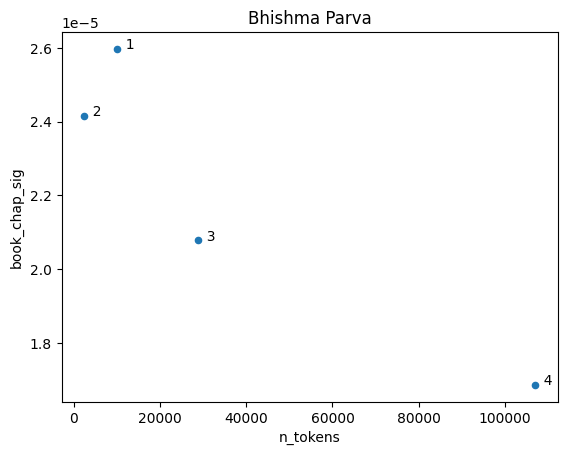

In [22]:
plot_n_sig(6);

### Updating the VOCAB using TFIDF Metrics

In [23]:
VOCAB["df"] = VOCAB["term_str"].map(DF)
VOCAB["idf"] = VOCAB["term_str"].map(TFIDF_dict['IDF'])
VOCAB['dp'] = VOCAB.df / len(DTCM)
VOCAB['di'] = np.log2(1/VOCAB.dp)
VOCAB['dh'] = VOCAB.dp * VOCAB.di
VOCAB['dfidf'] = VOCAB.df * VOCAB.idf
VOCAB['tfidf_mean'] = VOCAB['term_str'].map(TFIDF_dict['TFIDF'].mean())
VOCAB['tfidf_sum'] = VOCAB['term_str'].map(TFIDF_dict['TFIDF'].sum())


In [24]:
VOCAB["df"] = VOCAB["term_str"].map(DF)
VOCAB

,term_str,n,n_chars,p,i,s,h,stop,stem_porter,stem_snowball,...,n_pos,cat_pos,df,idf,dp,di,dh,dfidf,tfidf_mean,tfidf_sum
0,01,1,2,4.150354e-07,21.200262,2.409433e+06,0.000009,0,01,01,...,1,{'CD'},1.0,6.629357,0.010101,6.629357,0.066963,6.629357,2.544436e-07,0.000025
1,1,15,1,6.225531e-06,17.293372,1.606289e+05,0.000108,0,1,1,...,1,{'CD'},12.0,3.044394,0.121212,3.044394,0.369017,36.532729,2.026780e-05,0.002007
2,10,9,2,3.735319e-06,18.030337,2.677148e+05,0.000067,0,10,10,...,1,{'CD'},9.0,3.459432,0.090909,3.459432,0.314494,31.134885,1.559282e-05,0.001544
3,100,9,3,3.735319e-06,18.030337,2.677148e+05,0.000067,0,100,100,...,1,{'CD'},7.0,3.822002,0.070707,3.822002,0.270243,26.754012,7.185105e-06,0.000711
4,1000,41,4,1.701645e-05,15.842710,5.876666e+04,0.000270,0,1000,1000,...,1,{'CD'},12.0,3.044394,0.121212,3.044394,0.369017,36.532729,6.441742e-05,0.006377
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30677,zeal,2,4,8.300708e-07,20.200262,1.204716e+06,0.000017,0,zeal,zeal,...,1,{'NN'},2.0,5.629357,0.020202,5.629357,0.113724,11.258713,3.417086e-06,0.000338
30678,zealously,4,9,1.660142e-06,19.200262,6.023582e+05,0.000032,0,zealous,zealous,...,1,{'RB'},4.0,4.629357,0.040404,4.629357,0.187045,18.517426,8.618871e-06,0.000853
30679,zenana,1,6,4.150354e-07,21.200262,2.409433e+06,0.000009,0,zenana,zenana,...,1,{'NN'},1.0,6.629357,0.010101,6.629357,0.066963,6.629357,5.775179e-06,0.000572
30680,zodiac,2,6,8.300708e-07,20.200262,1.204716e+06,0.000017,0,zodiac,zodiac,...,1,{'NNP'},2.0,5.629357,0.020202,5.629357,0.113724,11.258713,1.183168e-05,0.001171


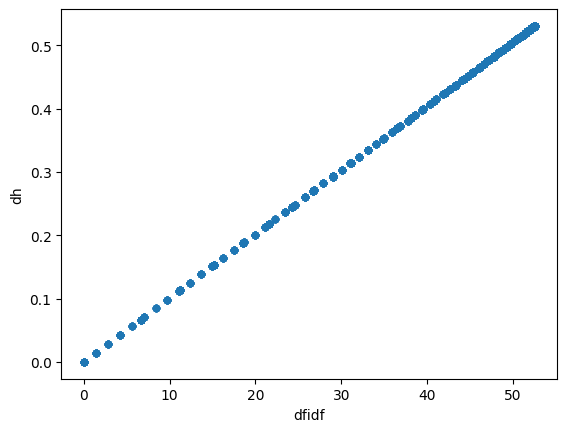

In [25]:

VOCAB.plot.scatter('dfidf', 'dh');

In [26]:
VOCAB.sample(25).sort_values('dh', ascending=False)[['term_str','max_pos', 'tfidf_mean', 'dh']].head(15)\
    .style.background_gradient(cmap='YlGnBu')

,term_str,max_pos,tfidf_mean,dh
7649,damsel,NN,0.000205,0.515314
22558,rolling,VBG,0.000032,0.506584
28671,vanished,VBD,0.000055,0.495611
8352,destitute,NN,0.000094,0.437858
6994,contempt,NN,0.000026,0.384605
6057,cherishes,VBZ,0.000030,0.314494
25225,stem,NN,0.000007,0.187045
20694,professional,JJ,0.000011,0.187045
20727,projects,NNS,0.000012,0.187045
20558,primary,JJ,0.000008,0.187045


In [27]:
# a = VOCAB[VOCAB['term_str'].str.startswith('d')==True]

px.scatter(VOCAB.reset_index(), x='i', y='tfidf_mean', 
           hover_name='term_str', hover_data=['n'], color='max_pos', 
           log_x=False, log_y=False, height=500, width=1000)

In [28]:
px.scatter(VOCAB.reset_index(), x='i', y='dh', 
           hover_name='term_str', hover_data=['n'], 
           color='max_pos_group', height=500, width=1000)

In [29]:
BOOK = CORPUS.loc[6].copy()

TTM = pd.get_dummies(BOOK['term_str'], columns=['term_str'], prefix='', prefix_sep='', drop_first=True)\
    .reset_index(drop=True).iloc[:,1:]
TTM.index.name = 'time_id'
TTM = TTM.astype('int')
cfg = {'figsize': (20,1)}

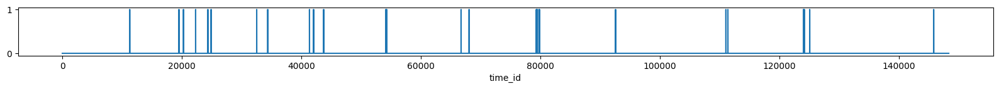

In [30]:
TTM['kesava'].plot(**cfg);

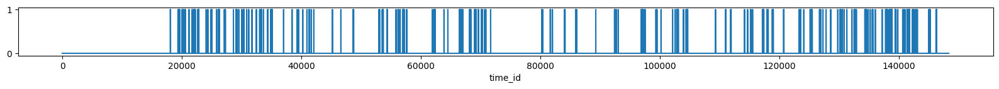

In [31]:
TTM['arjuna'].plot(**cfg);

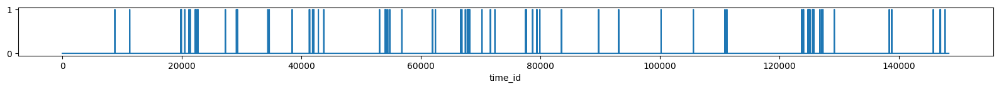

In [32]:
TTM['krishna'].plot(**cfg);

#### Cutting to Most Significant Vocabulary

In [33]:
thresh = VOCAB.dh.quantile(.9).round(3)
thresh

0.447

In [34]:
VOCAB2 = VOCAB.sort_values("n", ascending = False).reset_index().rename_axis("term_rank").reset_index().set_index("term_str")
VOCAB2.term_rank = VOCAB2.term_rank+1
VOCAB2

,term_rank,index,n,n_chars,p,i,s,h,stop,stem_porter,...,n_pos,cat_pos,df,idf,dp,di,dh,dfidf,tfidf_mean,tfidf_sum
term_str,,,,,,,,,,,,,,,,,,,,,
the,1,26639,163915,3,6.803053e-02,3.877674,1.469928e+01,0.263800,1,the,...,2,"{'VB', 'DT'}",99.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000
of,2,18678,129501,2,5.374750e-02,4.217659,1.860552e+01,0.226689,1,of,...,1,{'IN'},99.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000
and,3,3003,95887,3,3.979650e-02,4.651215,2.512784e+01,0.185102,1,and,...,1,{'CC'},99.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000
that,4,26637,47382,4,1.966521e-02,5.668211,5.085123e+01,0.111467,1,that,...,6,"{'RB', 'NNP', 'VBP', 'IN', 'WDT', 'DT'}",99.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000
to,5,26929,43192,2,1.792621e-02,5.801786,5.578424e+01,0.104004,1,to,...,1,{'TO'},99.0,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
jamvunadi,30678,14683,1,9,4.150354e-07,21.200262,2.409433e+06,0.000009,0,jamvunadi,...,1,{'NNP'},1.0,6.629357,0.010101,6.629357,0.066963,6.629357,6.657043e-06,0.000659
jamvuvan,30679,14685,1,8,4.150354e-07,21.200262,2.409433e+06,0.000009,0,jamvuvan,...,1,{'NNP'},1.0,6.629357,0.010101,6.629357,0.066963,6.629357,3.396216e-06,0.000336
janani,30680,14693,1,6,4.150354e-07,21.200262,2.409433e+06,0.000009,0,janani,...,1,{'NN'},1.0,6.629357,0.010101,6.629357,0.066963,6.629357,2.544436e-07,0.000025


In [35]:
VOCAB2.to_csv(fr"{output_dir}/CHAP_BOW/{data_prefix}-VOCAB2.csv", sep="|", index=True)
SIGS = VOCAB2[VOCAB2.dh > thresh]
len(SIGS)

3101

In [36]:
px.scatter(VOCAB2.reset_index(), x='i', y='dh', 
           hover_name='term_str', hover_data=['n'], 
           color='max_pos_group', height=500, width=1000)

In [37]:
SIGS.loc[SIGS.max_pos_group == 'NN'].sort_values('dh', ascending=False)[['term_rank', 'n', 'max_pos', 'df', 'dh']].head(10)

,term_rank,n,max_pos,df,dh
term_str,,,,,
shelter,2270,92,NN,36.0,0.530702
intent,2169,98,NN,36.0,0.530702
honours,1294,191,NNS,36.0,0.530702
conclusion,1870,118,NN,36.0,0.530702
appearance,1777,127,NN,36.0,0.530702
valour,1755,129,NN,36.0,0.530702
effulgent,2120,101,NN,36.0,0.530702
kindness,2057,105,NN,36.0,0.530702
sala,2653,73,NNP,36.0,0.530702


In [38]:
SIGS['max_pos_group'].value_counts()

max_pos_group
NN    1597
VB    1015
JJ     364
RB     104
IN      12
CD       3
PR       2
UH       1
FW       1
MD       1
WP       1
Name: count, dtype: int64

In [39]:
SIGS[['max_pos', 'n', 'i', 'dh']].head(25).style.background_gradient(cmap='YlGnBu')

,max_pos,n,i,dh
term_str,,,,
shafts,NNS,2704,9.799383,0.458572
pierced,VBD,1637,10.523424,0.471109
army,NN,1332,10.820884,0.464971
deities,NNS,1315,10.839415,0.522555
carwarriors,NNS,1286,10.871587,0.513804
troops,NNS,1204,10.966643,0.464971
sanjaya,NNP,1184,10.990809,0.528254
cut,VBD,1143,11.041653,0.497727
penances,NNS,1114,11.078729,0.502199


In [40]:
SIGS2 = SIGS[SIGS['max_pos_group'].apply(lambda x: x in ['NN','VB','JJ','RB'])]
SIGS2['max_pos_group'].value_counts().sum()

3080

In [41]:
TFIDF_reduced = TFIDF_dict['TFIDF'][SIGS2.index]
TFIDF_reduced.to_csv(fr"{output_dir}\CHAP_BOW\{data_prefix}-TFIDF_REDUCED_CHAPS.csv",sep = "|")
TFIDF_reduced

term_str           shafts   pierced      army   deities  carwarriors  \
book_id chap_id                                                        
1       1        0.000000  0.000339  0.000547  0.000000     0.000000   
        2        0.000000  0.000098  0.000570  0.000139     0.000000   
        3        0.000000  0.000000  0.000000  0.000196     0.000000   
        4        0.000000  0.000182  0.000000  0.000000     0.000000   
        5        0.000000  0.000194  0.000000  0.000314     0.000000   
...                   ...       ...       ...       ...          ...   
15      2        0.000000  0.000000  0.000000  0.002658     0.000163   
        3        0.000312  0.000000  0.000000  0.000000     0.000000   
16      1        0.000888  0.000210  0.000000  0.000596     0.001233   
17      1        0.000000  0.000000  0.000000  0.003143     0.000000   
18      1        0.000000  0.000000  0.000000  0.003207     0.000641   

term_str           troops   sanjaya       cut  penances    partha  ...  \
book_id chap_id                                                    ...   
1       1        0.000000  0.012707  0.000000  0.000000  0.000000  ...   
        2        0.000760  0.000755  0.000000  0.000000  0.000000  ...   
        3        0.000000  0.000000  0.000000  0.000000  0.000000  ...   
        4        0.000000  0.000000  0.000000  0.000435  0.000000  ...   
        5        0.000000  0.000000  0.000161  0.000961  0.000000  ...   
...                   ...       ...       ...       ...       ...  ...   
15      2        0.000363  0.000000  0.000000  0.003736  0.000000  ...   
        3        0.000000  0.006663  0.000000  0.001989  0.000000  ...   
16      1        0.000204  0.000000  0.000000  0.000503  0.000840  ...   
17      1        0.000000  0.000000  0.000000  0.000663  0.000277  ...   
18      1        0.000000  0.000000  0.000114  0.000470  0.000000  ...   

term_str         propitiatory  apartment   anguish    thorn  cheered  \
book_id chap_id                                                        
1       1                 0.0   0.000000  0.000317  0.00000      0.0   
        2                 0.0   0.000000  0.000000  0.00000      0.0   
        3                 0.0   0.000000  0.000000  0.00000      0.0   
        4                 0.0   0.001055  0.000000  0.00000      0.0   
        5                 0.0   0.000000  0.000000  0.00008      0.0   
...                       ...        ...       ...      ...      ...   
15      2                 0.0   0.000000  0.000000  0.00000      0.0   
        3                 0.0   0.000000  0.000000  0.00000      0.0   
16      1                 0.0   0.000000  0.000000  0.00000      0.0   
17      1                 0.0   0.000000  0.000000  0.00000      0.0   
18      1                 0.0   0.000000  0.000000  0.00000      0.0   

term_str         believing     tops  pressing       hid    affair  
book_id chap_id                                                    
1       1              0.0  0.00000   0.00000  0.000000  0.000000  
        2              0.0  0.00000   0.00000  0.000000  0.000000  
        3              0.0  0.00000   0.00000  0.000000  0.000000  
        4              0.0  0.00000   0.00000  0.000000  0.000528  
        5              0.0  0.00008   0.00008  0.000078  0.000000  
...                    ...      ...       ...       ...       ...  
15      2              0.0  0.00000   0.00000  0.000000  0.000000  
        3              0.0  0.00000   0.00000  0.000000  0.000000  
16      1              0.0  0.00000   0.00000  0.000000  0.000000  
17      1              0.0  0.00000   0.00000  0.000000  0.000000  
18      1              0.0  0.00000   0.00000  0.000000  0.000000  

[99 rows x 3080 columns]

In [42]:
TFIDF_reduced.sum(axis=1).sort_values()

book_id  chap_id
17       1          0.181528
1        16         0.182794
         14         0.186344
2        8          0.187958
         7          0.189220
                      ...   
7        6          0.262341
3        14         0.265834
7        5          0.266734
         2          0.267108
         7          0.269663
Length: 99, dtype: float64

In [43]:
TFIDF_SIGS_L2 = pd.DataFrame(normalize(TFIDF_reduced, norm='l2', axis=1), 
                             columns=TFIDF_reduced.columns, 
                             index=TFIDF_reduced.index)
TFIDF_SIGS_L2

term_str           shafts   pierced      army   deities  carwarriors  \
book_id chap_id                                                        
1       1        0.000000  0.017978  0.029045  0.000000     0.000000   
        2        0.000000  0.006462  0.037584  0.009168     0.000000   
        3        0.000000  0.000000  0.000000  0.013734     0.000000   
        4        0.000000  0.009420  0.000000  0.000000     0.000000   
        5        0.000000  0.020106  0.000000  0.032600     0.000000   
...                   ...       ...       ...       ...          ...   
15      2        0.000000  0.000000  0.000000  0.226051     0.013851   
        3        0.017530  0.000000  0.000000  0.000000     0.000000   
16      1        0.062153  0.014705  0.000000  0.041726     0.086291   
17      1        0.000000  0.000000  0.000000  0.201742     0.000000   
18      1        0.000000  0.000000  0.000000  0.296294     0.059203   

term_str           troops   sanjaya       cut  penances    partha  ...  \
book_id chap_id                                                    ...   
1       1        0.000000  0.674489  0.000000  0.000000  0.000000  ...   
        2        0.050112  0.049816  0.000000  0.000000  0.000000  ...   
        3        0.000000  0.000000  0.000000  0.000000  0.000000  ...   
        4        0.000000  0.000000  0.000000  0.022543  0.000000  ...   
        5        0.000000  0.000000  0.016690  0.099664  0.000000  ...   
...                   ...       ...       ...       ...       ...  ...   
15      2        0.030889  0.000000  0.000000  0.317740  0.000000  ...   
        3        0.000000  0.374090  0.000000  0.111660  0.000000  ...   
16      1        0.014255  0.000000  0.000000  0.035190  0.058821  ...   
17      1        0.000000  0.000000  0.000000  0.042535  0.017775  ...   
18      1        0.000000  0.000000  0.010552  0.043458  0.000000  ...   

term_str         propitiatory  apartment  anguish    thorn  cheered  \
book_id chap_id                                                       
1       1                 0.0   0.000000  0.01683  0.00000      0.0   
        2                 0.0   0.000000  0.00000  0.00000      0.0   
        3                 0.0   0.000000  0.00000  0.00000      0.0   
        4                 0.0   0.054643  0.00000  0.00000      0.0   
        5                 0.0   0.000000  0.00000  0.00833      0.0   
...                       ...        ...      ...      ...      ...   
15      2                 0.0   0.000000  0.00000  0.00000      0.0   
        3                 0.0   0.000000  0.00000  0.00000      0.0   
16      1                 0.0   0.000000  0.00000  0.00000      0.0   
17      1                 0.0   0.000000  0.00000  0.00000      0.0   
18      1                 0.0   0.000000  0.00000  0.00000      0.0   

term_str         believing     tops  pressing       hid    affair  
book_id chap_id                                                    
1       1              0.0  0.00000   0.00000  0.000000  0.000000  
        2              0.0  0.00000   0.00000  0.000000  0.000000  
        3              0.0  0.00000   0.00000  0.000000  0.000000  
        4              0.0  0.00000   0.00000  0.000000  0.027321  
        5              0.0  0.00833   0.00833  0.008066  0.000000  
...                    ...      ...       ...       ...       ...  
15      2              0.0  0.00000   0.00000  0.000000  0.000000  
        3              0.0  0.00000   0.00000  0.000000  0.000000  
16      1              0.0  0.00000   0.00000  0.000000  0.000000  
17      1              0.0  0.00000   0.00000  0.000000  0.000000  
18      1              0.0  0.00000   0.00000  0.000000  0.000000  

[99 rows x 3080 columns]

In [44]:
l2_norms = np.linalg.norm(TFIDF_SIGS_L2.values, ord=2, axis=1)
print(l2_norms.min(), l2_norms.max())

0.9999999999999966 1.0000000000000038


In [45]:
TFIDF_SIGS_L2.to_csv(fr"{output_dir}/CHAP_BOW/{data_prefix}-TFIDF_REDUCED_CHAPS_L2.csv", sep="|")